In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib
matplotlib.rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['text.latex.unicode'] = True
matplotlib.rcParams['figure.dpi'] = 150

import matplotlib.pyplot as plt
matplotlib.rcParams.update({'figure.autolayout': True})

import seaborn as sns
sns.set(style='whitegrid', font_scale=0.9, rc={"lines.linewidth": 1.4,
                                           'lines.markersize': 1.6}, font="serif")

# import jtplot module in notebook
from jupyterthemes import jtplot

# choose which theme to inherit plotting style from
# onedork | grade3 | oceans16 | chesterish | monokai | solarizedl | solarizedd
jtplot.style(theme='oceans16')

# set "context" (paper, notebook, talk, poster)
# scale font-size of ticklabels, legend, etc.
# remove spines from x and y axes and make grid dashed
jtplot.style(context='notebook', fscale=1, spines=False, gridlines='--')

# turn on X- and Y-axis tick marks (default=False)
# turn off the axis grid lines (default=True)
# and set the default figure size

from mpl_toolkits import mplot3d

/Users/dylancromer/.venvs/maszcal/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  


In [4]:
import numpy as np
import scipy.linalg
import sklearn.decomposition as skdecomp
import maszcal.lensing.shear as shear
from maszcal.interp_utils import cartesian_prod
import supercubos

In [5]:
zs = np.linspace(0, 1, 30)
model = shear.SingleMassBaryonShearModel(redshifts=zs, delta=500, mass_definition='crit')

In [6]:
rs = np.logspace(-1, 1, 80)

param_mins = np.array([2, 0.5, 3.4]) #con, alpha, beta
param_maxes = np.array([3, 1, 3.8])

num = 40

lh = supercubos.LatinSampler().get_lh_sample(
    param_mins=param_mins,
    param_maxes=param_maxes,
    num_samples=40,
)



mus = np.ones(1) * np.log(2e14)
cons = lh.T[0]
alphas = lh.T[1]
betas = lh.T[2]
gammas = np.ones(1) * 0.2

esds = model.delta_sigma(rs, mus, cons, alphas, betas, gammas)

In [7]:
colors = ['#1fcbff', '#b185ff', '#03fcd3'] 

In [8]:
def scatter_plot_for_param(data, param_index, ax, color, alpha=0.1):
    for i, _ in enumerate(zs):
        ax.scatter3D(
            np.log(rs),
            np.tile(zs[i:i+1], rs.size),
            data[i, :, param_index],
            color=color,
            alpha=alpha,
        )

In [9]:
point_colors = ['#6cc46b', '#6d85e4', '#69c4a3', '#64abd7']
point_colors = 10*point_colors
background_color = (33/255, 36/255, 48/255, 1)

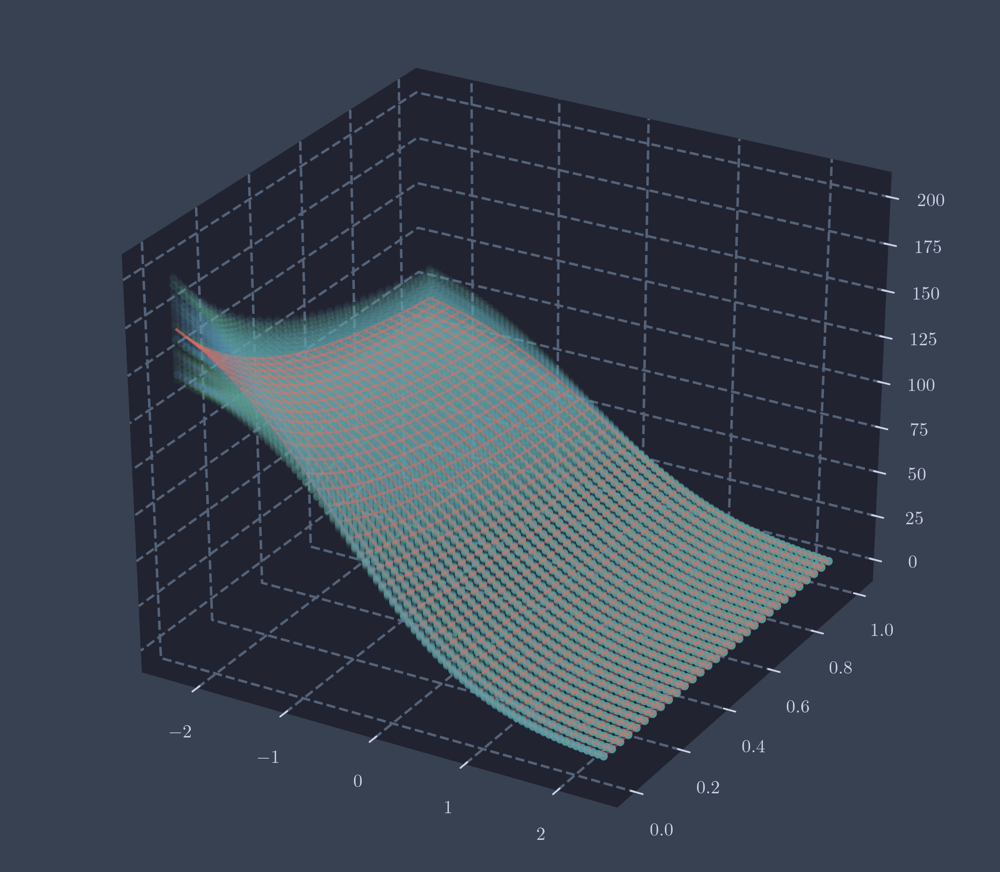

In [10]:
X, Y = np.meshgrid(np.log(rs), zs)
ax = plt.axes(projection='3d')
for i in range(num):
    scatter_plot_for_param(esds, i, ax, color=point_colors[i], alpha=0.05)
ax.plot_wireframe(X, Y, esds.mean(axis=-1), color='#f7685d', alpha=0.4)
ax.w_xaxis.set_pane_color(background_color)
ax.w_yaxis.set_pane_color(background_color)
ax.w_zaxis.set_pane_color(background_color)

plt.savefig('../figs/pca/esds.pdf', bbox_inches='tight')
pass

In [11]:
data = rs[None, :, None]*esds

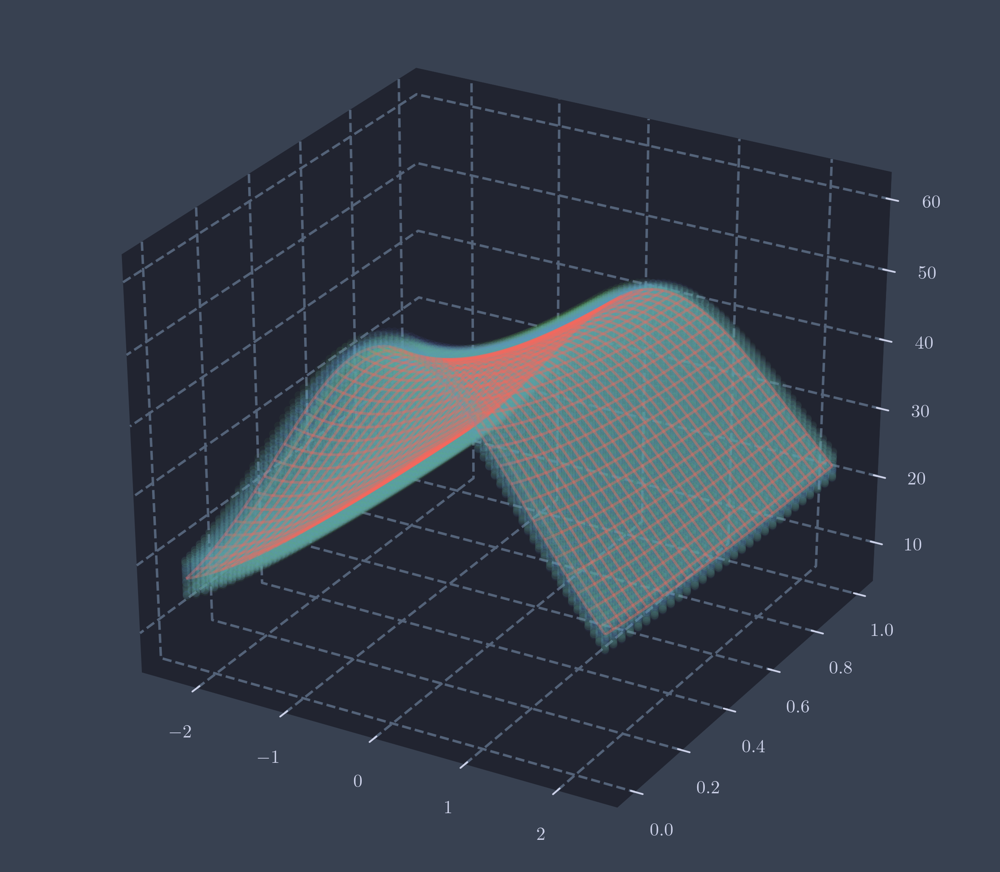

In [12]:
ax = plt.axes(projection='3d')
for i in range(num):
    scatter_plot_for_param(data, i, ax, color=point_colors[i], alpha=0.05)
ax.plot_wireframe(X, Y, data.mean(axis=-1), color='#f7685d', alpha=0.4)
ax.w_xaxis.set_pane_color(background_color)
ax.w_yaxis.set_pane_color(background_color)
ax.w_zaxis.set_pane_color(background_color)

plt.savefig('../figs/pca/resds.pdf', bbox_inches='tight')
pass

In [13]:
shifted = data - data.mean(axis=-1)[..., None]

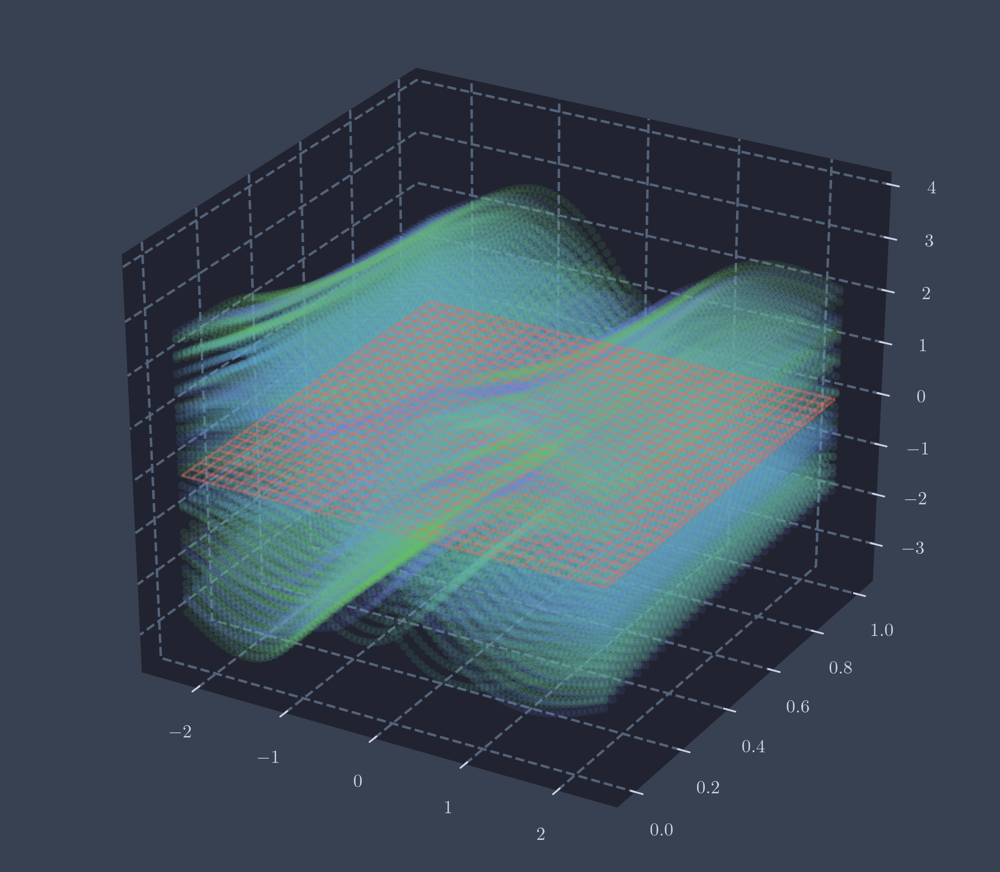

In [15]:
ax = plt.axes(projection='3d')
for i in range(num):
    scatter_plot_for_param(shifted, i, ax, color=point_colors[i], alpha=0.1)
ax.plot_wireframe(X, Y, shifted.mean(axis=-1), color='#f7685d', alpha=0.4)
ax.w_xaxis.set_pane_color(background_color)
ax.w_yaxis.set_pane_color(background_color)
ax.w_zaxis.set_pane_color(background_color)

plt.savefig('../figs/pca/shifted.pdf', bbox_inches='tight')
pass

In [17]:
scaled_shifted = shifted/np.std(shifted, axis=-1)[..., None]

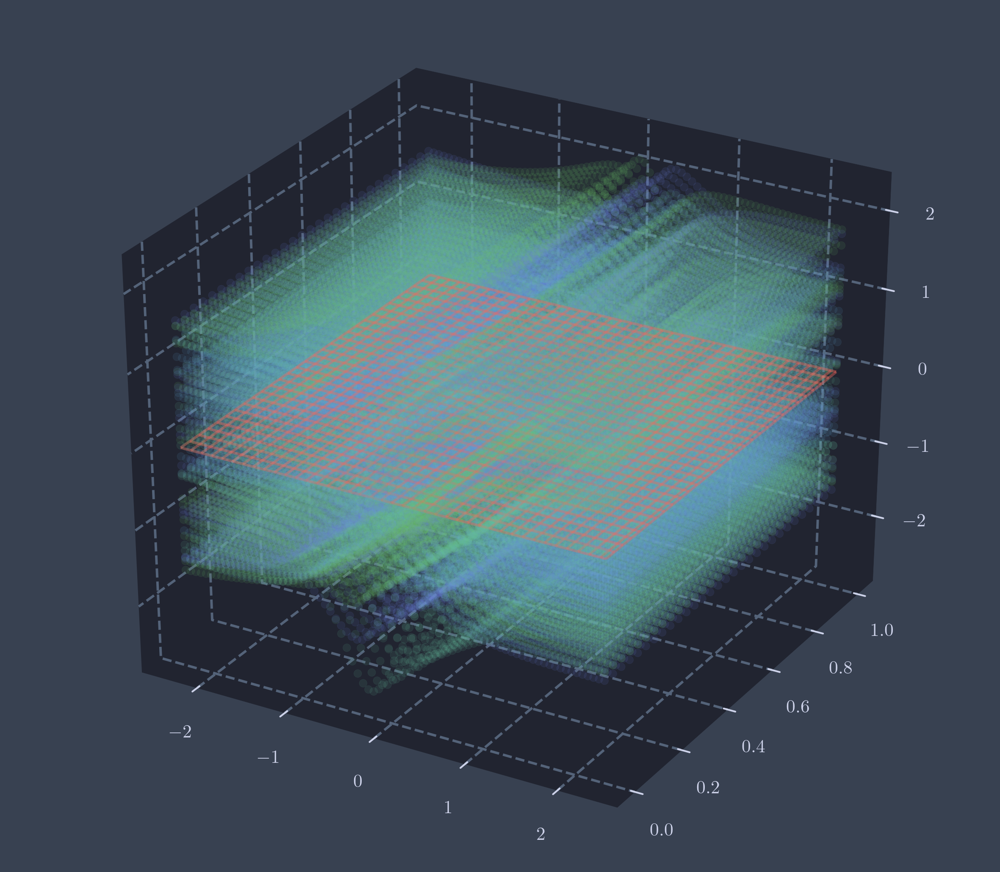

In [18]:
ax = plt.axes(projection='3d')
for i in range(num):
    scatter_plot_for_param(scaled_shifted, i, ax, color=point_colors[i], alpha=0.1)
ax.plot_wireframe(X, Y, scaled_shifted.mean(axis=-1), color='#f7685d', alpha=0.4)
ax.w_xaxis.set_pane_color(background_color)
ax.w_yaxis.set_pane_color(background_color)
ax.w_zaxis.set_pane_color(background_color)

plt.savefig('../figs/pca/scaled_shifted.pdf', bbox_inches='tight')
pass

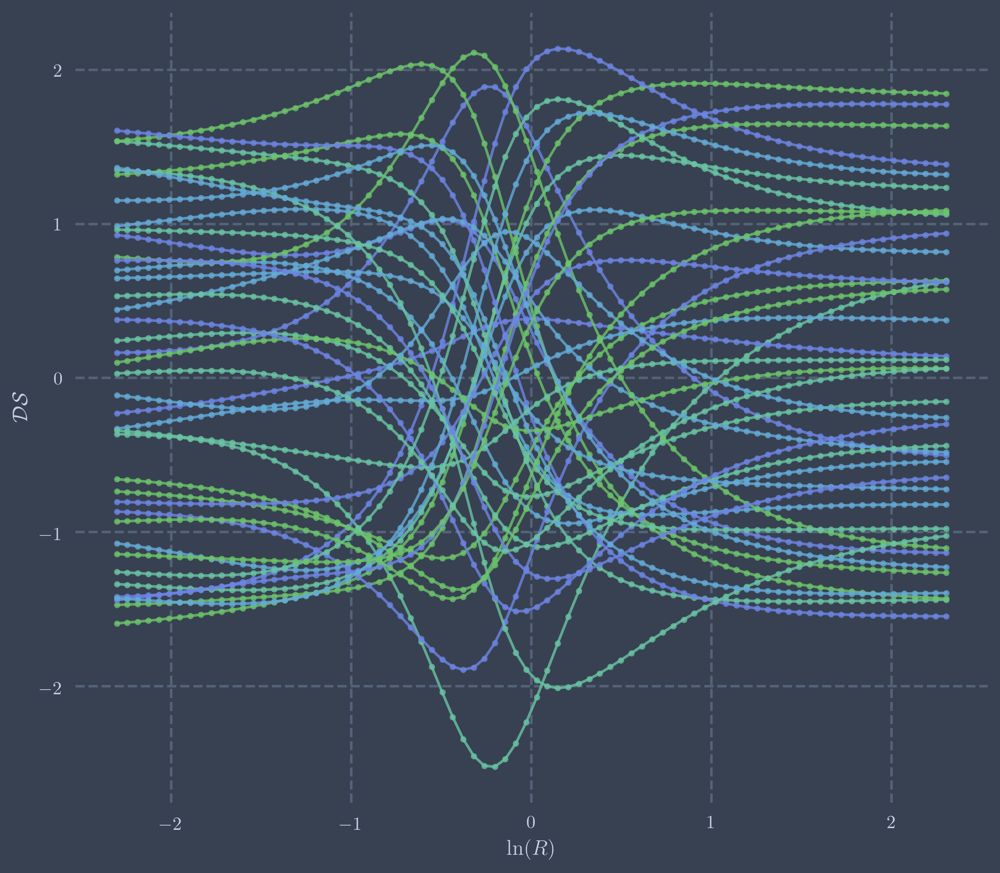

In [19]:
for i in range(num):
    plt.plot(
        np.log(rs),
        scaled_shifted[0, :, i],
        color=point_colors[i],
        linestyle='-',
        marker='.',
        alpha=0.8,
    )
    
plt.xlabel(r'$\ln(R)$')
plt.ylabel(r'$\mathcal{DS}$')

plt.savefig('../figs/pca/scaled_shifted_slice.pdf', bbox_inches='tight')
pass

In [20]:
def svd_flip(u, v, u_based_decision=True):
    '''
    Sign correction to ensure deterministic output from SVD.
    Adjusts the columns of u and the rows of v such that the loadings in the
    columns in u that are largest in absolute value are always positive.
    Parameters
    ----------
    u : ndarray
        u and v are the output of `linalg.svd` or
        :func:`~sklearn.utils.extmath.randomized_svd`, with matching inner
        dimensions so one can compute `np.dot(u * s, v)`.
    v : ndarray
        u and v are the output of `linalg.svd` or
        :func:`~sklearn.utils.extmath.randomized_svd`, with matching inner
        dimensions so one can compute `np.dot(u * s, v)`.
    u_based_decision : boolean, (default=True)
        If True, use the columns of u as the basis for sign flipping.
        Otherwise, use the rows of v. The choice of which variable to base the
        decision on is generally algorithm dependent.
    Returns
    -------
    u_adjusted, v_adjusted : arrays with the same dimensions as the input.
    '''
    if u_based_decision:
        # columns of u, rows of v
        max_abs_cols = np.argmax(np.abs(u), axis=0)
        signs = np.sign(u[max_abs_cols, range(u.shape[1])])
        u *= signs
        v *= signs[:, np.newaxis]
    else:
        # rows of v, columns of u
        max_abs_rows = np.argmax(np.abs(v), axis=1)
        signs = np.sign(v[range(v.shape[0]), max_abs_rows])
        u *= signs
        v *= signs[:, np.newaxis]
    return u, v


def svd_for_pca(X):
    '''
    Fit the model by computing full SVD on X
    '''
    n_samples, n_features = X.shape

    U, S, V = scipy.linalg.svd(X, full_matrices=False)
    # flip eigenvectors' sign to enforce deterministic output
    U, V = svd_flip(U, V)
    return U, S, V


def explained_variance(S, n_samples):
    explained_variance_ = (S ** 2) / (n_samples - 1)
    total_var = explained_variance_.sum()
    return explained_variance_ / total_var

In [21]:
np.all(scaled_shifted.reshape(-1, num).reshape(zs.size, rs.size, num) == scaled_shifted)

True

In [22]:
preprocessed = scaled_shifted.reshape(-1, num)
preprocessed.shape

(2400, 40)

In [23]:
U, S, V = svd_for_pca(preprocessed)

explained_var = explained_variance(S, preprocessed.shape[0])

In [24]:
for var in explained_var:
    if var > 1e-6:
        print(100*var)
    else:
        break

84.1040785608262
15.233120715874271
0.6227014463420953
0.03208838961683894
0.007391268749802133
0.0005516991881659629


In [25]:
phis = U @ np.diagflat(S) / np.sqrt(num)

In [26]:
weights = np.sqrt(num) * V

In [27]:
np.allclose((phis @ weights), preprocessed)

True

In [28]:
phis = phis[:, :6]
weights = weights[:6, :]
print(np.allclose(phis @ weights, preprocessed, atol=1e-2))
np.max((phis @ weights) - preprocessed)

True


0.005612908202311306

In [29]:
def resh(phi):
    return phi.reshape(zs.size, rs.size, -1)

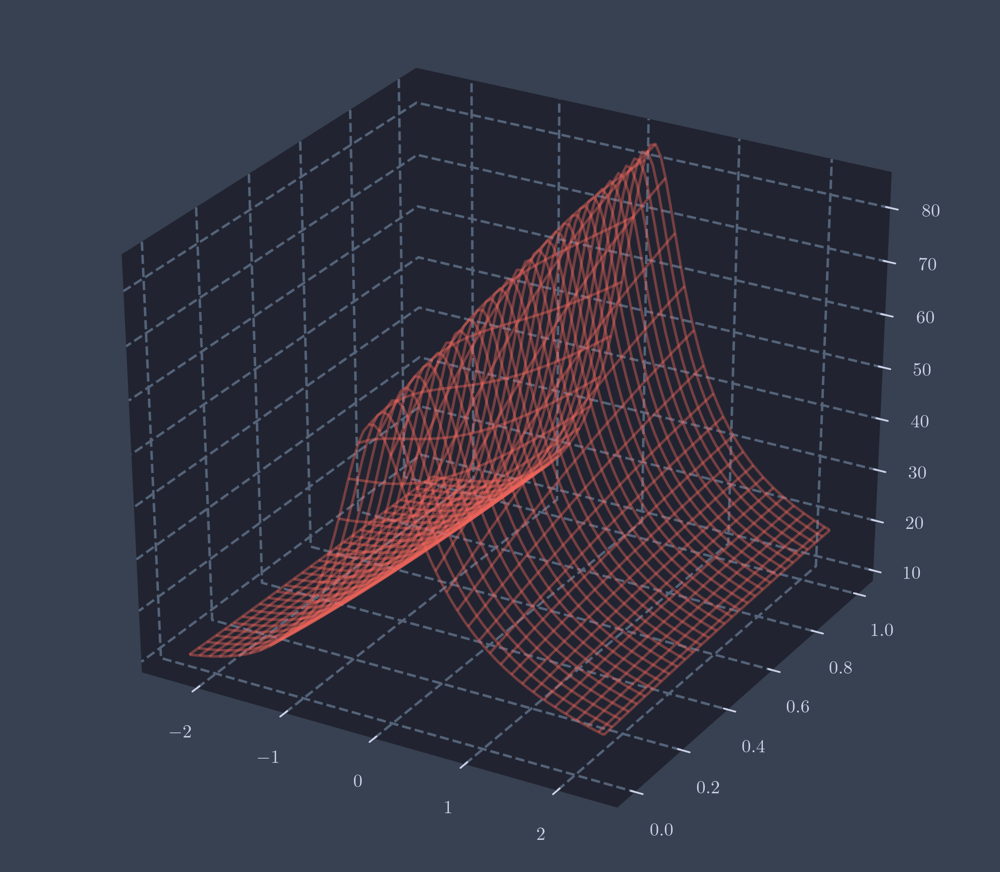

In [30]:
scaled = data/data.std(axis=-1)[..., None]

ax = plt.axes(projection='3d')
ax.plot_wireframe(X, Y, scaled.mean(axis=-1), color='#f7685d', alpha=0.4)
ax.w_xaxis.set_pane_color(background_color)
ax.w_yaxis.set_pane_color(background_color)
ax.w_zaxis.set_pane_color(background_color)

plt.savefig('../figs/pca/scaled_mean.pdf', bbox_inches='tight')
pass

In [31]:
def create_grid(data, ax, color):
    ax.plot_wireframe(X, Y, data, color=color, alpha=0.4)
    ax.w_xaxis.set_pane_color(background_color)
    ax.w_yaxis.set_pane_color(background_color)
    ax.w_zaxis.set_pane_color(background_color)

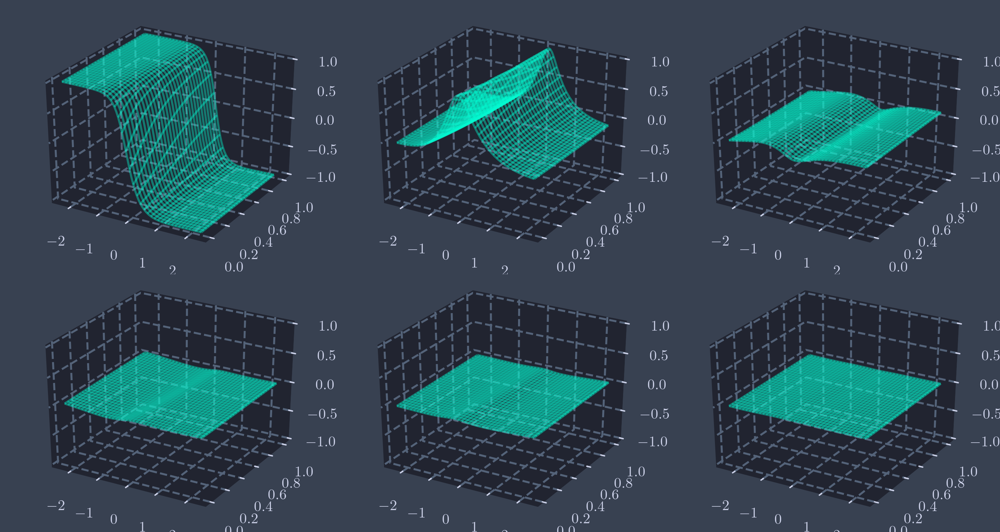

In [32]:
fig = plt.figure(figsize=(10, 8))

for i in range(6):
    plotnum = 331 + i
    ax = fig.add_subplot(plotnum, projection='3d')
    create_grid(resh(phis)[:, :, i], ax, colors[2])
    ax.set_zlim(-1, 1)

plt.savefig('../figs/pca/phis.pdf', bbox_inches='tight')
pass

In [39]:
explained_var[:6].sum() * 100

99.99993208059736